In [43]:
import pandas as pd
import numpy as np
from tqdm import tqdm_notebook
import ast

from sklearn.preprocessing import LabelEncoder
from xgboost.sklearn import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import GridSearchCV

In [2]:
df_league = pd.read_csv('/home/bruno/Downloads/leagueoflegends/LeagueofLegends.csv')

In [3]:
df_league.head()

,League,Year,Season,Type,blueTeamTag,bResult,rResult,redTeamTag,gamelength,golddiff,...,redMiddleChamp,goldredMiddle,redADC,redADCChamp,goldredADC,redSupport,redSupportChamp,goldredSupport,redBans,Address
0,NALCS,2015,Spring,Season,TSM,1,0,C9,40,"[0, 0, -14, -65, -268, -431, -488, -789, -494,...",...,Fizz,"[475, 475, 552, 842, 1178, 1378, 1635, 1949, 2...",Sneaky,Sivir,"[475, 475, 532, 762, 1097, 1469, 1726, 2112, 2...",LemonNation,Thresh,"[515, 515, 577, 722, 911, 1042, 1194, 1370, 14...","['Tristana', 'Leblanc', 'Nidalee']",http://matchhistory.na.leagueoflegends.com/en/...
1,NALCS,2015,Spring,Season,CST,0,1,DIG,38,"[0, 0, -26, -18, 147, 237, -152, 18, 88, -242,...",...,Azir,"[475, 475, 552, 786, 1097, 1389, 1660, 1955, 2...",CoreJJ,Corki,"[475, 475, 532, 868, 1220, 1445, 1732, 1979, 2...",KiWiKiD,Annie,"[515, 515, 583, 752, 900, 1066, 1236, 1417, 15...","['RekSai', 'Janna', 'Leblanc']",http://matchhistory.na.leagueoflegends.com/en/...
2,NALCS,2015,Spring,Season,WFX,1,0,GV,40,"[0, 0, 10, -60, 34, 37, 589, 1064, 1258, 913, ...",...,Azir,"[475, 475, 533, 801, 1006, 1233, 1385, 1720, 1...",Cop,Corki,"[475, 475, 533, 781, 1085, 1398, 1782, 1957, 2...",BunnyFuFuu,Janna,"[515, 515, 584, 721, 858, 1002, 1168, 1303, 14...","['Leblanc', 'Zed', 'RekSai']",http://matchhistory.na.leagueoflegends.com/en/...
3,NALCS,2015,Spring,Season,TIP,0,1,TL,41,"[0, 0, -15, 25, 228, -6, -243, 175, -346, 16, ...",...,Lulu,"[475, 475, 532, 771, 1046, 1288, 1534, 1776, 2...",KEITH,KogMaw,"[475, 475, 532, 766, 1161, 1438, 1776, 1936, 2...",Xpecial,Janna,"[515, 515, 583, 721, 870, 1059, 1205, 1342, 15...","['RekSai', 'Rumble', 'LeeSin']",http://matchhistory.na.leagueoflegends.com/en/...
4,NALCS,2015,Spring,Season,CLG,1,0,T8,35,"[40, 40, 44, -36, 113, 158, -121, -191, 23, 20...",...,Lulu,"[475, 475, 532, 807, 1042, 1338, 1646, 1951, 2...",Maplestreet8,Corki,"[475, 475, 532, 792, 1187, 1488, 1832, 2136, 2...",Dodo8,Annie,"[475, 475, 538, 671, 817, 948, 1104, 1240, 136...","['Rumble', 'Sivir', 'Rengar']",http://matchhistory.na.leagueoflegends.com/en/...


In [4]:
df_league.shape

(7620, 57)

In [5]:
df_league.columns

Index(['League', 'Year', 'Season', 'Type', 'blueTeamTag', 'bResult', 'rResult',
       'redTeamTag', 'gamelength', 'golddiff', 'goldblue', 'bKills', 'bTowers',
       'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'goldred', 'rKills',
       'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds', 'blueTop',
       'blueTopChamp', 'goldblueTop', 'blueJungle', 'blueJungleChamp',
       'goldblueJungle', 'blueMiddle', 'blueMiddleChamp', 'goldblueMiddle',
       'blueADC', 'blueADCChamp', 'goldblueADC', 'blueSupport',
       'blueSupportChamp', 'goldblueSupport', 'blueBans', 'redTop',
       'redTopChamp', 'goldredTop', 'redJungle', 'redJungleChamp',
       'goldredJungle', 'redMiddle', 'redMiddleChamp', 'goldredMiddle',
       'redADC', 'redADCChamp', 'goldredADC', 'redSupport', 'redSupportChamp',
       'goldredSupport', 'redBans', 'Address'],
      dtype='object')

In [6]:
red_columns = ['League', 'Year', 'Season', 'Type', 'redTeamTag', 'gamelength', 'golddiff', 'goldred', 'rKills', 'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds', 'redTop', 'redTopChamp', 'goldredTop', 'redJungle', 'redJungleChamp', 'goldredJungle', 'redMiddle', 'redMiddleChamp', 'goldredMiddle', 'redADC', 'redADCChamp', 'goldredADC', 'redSupport', 'redSupportChamp', 'goldredSupport', 'rResult']

In [7]:
blue_columns = ['League', 'Year', 'Season', 'Type', 'blueTeamTag', 'gamelength', 'golddiff', 'goldblue', 'bKills', 'bTowers', 'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'blueTop', 'blueTopChamp', 'goldblueTop', 'blueJungle', 'blueJungleChamp', 'goldblueJungle', 'blueMiddle', 'blueMiddleChamp', 'goldblueMiddle', 'blueADC', 'blueADCChamp', 'goldblueADC', 'blueSupport', 'blueSupportChamp', 'goldblueSupport', 'bResult']

In [8]:
df_final_league = pd.DataFrame()
for i, row in tqdm_notebook(df_league.iterrows()):
    
    #Red Team Append
    df_aux = pd.DataFrame()
    
    row_aux = row[red_columns]
    
    row_aux = row_aux.rename({'redTeamTag': 'TeamTag',
                                'goldred': 'Gold',
                                'rKills': 'Kills',
                                'rTowers': 'Towers',
                                'rInhibs': 'Inhibs',
                                'rDragons': 'Dragons',
                                'rBarons': 'Barons',
                                'rHeralds': 'Heralds',
                                'redTop': 'Top',
                                'redTopChamp': 'TopChamp',
                                'goldredTop': 'GoldTop',
                                'redJungle': 'Jungle',
                                'redJungleChamp': 'JungleChamp',
                                'goldredJungle': 'GoldJungle',
                                'redMiddle': 'Middle',
                                'redMiddleChamp': 'MiddleChamp',
                                'goldredMiddle': 'GoldMiddle',
                                'redADC': 'ADC',
                                'redADCChamp': 'ADCChamp',
                                'goldredADC': 'GoldADC',
                                'redSupport': 'Support',
                                'redSupportChamp': 'SupportChamp',
                                'goldredSupport': 'GoldSupport',
                                'rResult': 'Result'})
    
    df_aux = pd.DataFrame([row_aux])
    
    
    df_final_league = pd.concat([df_final_league, df_aux])
    
    #Blue Team Append
    df_aux = pd.DataFrame()
    
    row_aux = row[blue_columns]
    
    row_aux = row_aux.rename({'blueTeamTag': 'TeamTag',
                                'goldblue': 'Gold',
                                'bKills': 'Kills',
                                'bTowers': 'Towers',
                                'bInhibs': 'Inhibs',
                                'bDragons': 'Dragons',
                                'bBarons': 'Barons',
                                'bHeralds': 'Heralds',
                                'blueTop': 'Top',
                                'blueTopChamp': 'TopChamp',
                                'goldblueTop': 'GoldTop',
                                'blueJungle': 'Jungle',
                                'blueJungleChamp': 'JungleChamp',
                                'goldblueJungle': 'GoldJungle',
                                'blueMiddle': 'Middle',
                                'blueMiddleChamp': 'MiddleChamp',
                                'goldblueMiddle': 'GoldMiddle',
                                'blueADC': 'ADC',
                                'blueADCChamp': 'ADCChamp',
                                'goldblueADC': 'GoldADC',
                                'blueSupport': 'Support',
                                'blueSupportChamp': 'SupportChamp',
                                'goldblueSupport': 'GoldSupport',
                                'bResult': 'Result'})
    
    df_aux = pd.DataFrame([row_aux])
    
    
    df_final_league = pd.concat([df_final_league, df_aux])

In [9]:
df_final_league.reset_index(drop=True, inplace=True)

In [10]:
df_final_league.head()

,League,Year,Season,Type,TeamTag,gamelength,golddiff,Gold,Kills,Towers,...,Middle,MiddleChamp,GoldMiddle,ADC,ADCChamp,GoldADC,Support,SupportChamp,GoldSupport,Result
0,NALCS,2015,Spring,Season,C9,40,"[0, 0, -14, -65, -268, -431, -488, -789, -494,...","[2415, 2415, 2725, 3952, 5336, 6602, 7900, 945...","[[16.529, 'TSM Lustboy', 'C9 Balls', ['C9 Mete...","[[39.23, 'TOP_LANE', 'INNER_TURRET'], [20.681,...",...,Hai,Fizz,"[475, 475, 552, 842, 1178, 1378, 1635, 1949, 2...",Sneaky,Sivir,"[475, 475, 532, 762, 1097, 1469, 1726, 2112, 2...",LemonNation,Thresh,"[515, 515, 577, 722, 911, 1042, 1194, 1370, 14...",0
1,NALCS,2015,Spring,Season,TSM,40,"[0, 0, -14, -65, -268, -431, -488, -789, -494,...","[2415, 2415, 2711, 3887, 5068, 6171, 7412, 866...","[[10.82, 'C9 Hai', 'TSM Bjergsen', [], 9229, 8...","[[27.542, 'MID_LANE', 'BASE_TURRET'], [39.269,...",...,Bjergsen,Ahri,"[475, 475, 532, 807, 1102, 1307, 1651, 1950, 2...",WildTurtle,Jinx,"[475, 475, 532, 797, 1127, 1453, 1766, 2044, 2...",Lustboy,Janna,"[515, 515, 583, 726, 897, 1077, 1227, 1381, 15...",1
2,NALCS,2015,Spring,Season,DIG,38,"[0, 0, -26, -18, 147, 237, -152, 18, 88, -242,...","[2415, 2415, 2731, 4126, 5364, 6560, 7789, 893...","[[12.387, 'CST Jesiz', 'DIG Gamsu', ['DIG Ship...","[[19.257, 'MID_LANE', 'OUTER_TURRET'], [15.206...",...,Shiphtur,Azir,"[475, 475, 552, 786, 1097, 1389, 1660, 1955, 2...",CoreJJ,Corki,"[475, 475, 532, 868, 1220, 1445, 1732, 1979, 2...",KiWiKiD,Annie,"[515, 515, 583, 752, 900, 1066, 1236, 1417, 15...",1
3,NALCS,2015,Spring,Season,CST,38,"[0, 0, -26, -18, 147, 237, -152, 18, 88, -242,...","[2415, 2415, 2705, 4108, 5511, 6797, 7637, 895...","[[11.104, 'DIG Shiphtur', 'CST Jesiz', ['CST I...","[[23.239, 'BOT_LANE', 'OUTER_TURRET'], [33.018...",...,Jesiz,Ahri,"[475, 475, 532, 816, 1102, 1413, 1624, 1937, 2...",Mash,Caitlyn,"[475, 475, 532, 856, 1182, 1468, 1653, 1890, 2...",Sheep,Leona,"[515, 515, 577, 750, 924, 1073, 1239, 1392, 15...",0
4,NALCS,2015,Spring,Season,GV,40,"[0, 0, 10, -60, 34, 37, 589, 1064, 1258, 913, ...","[2415, 2415, 2716, 3854, 4899, 6199, 7520, 859...","[[8.449, 'WFX Altec', 'GV Cop', ['GV BunnyFuFu...","[[24.62, 'MID_LANE', 'OUTER_TURRET'], [30.493,...",...,Keane,Azir,"[475, 475, 533, 801, 1006, 1233, 1385, 1720, 1...",Cop,Corki,"[475, 475, 533, 781, 1085, 1398, 1782, 1957, 2...",BunnyFuFuu,Janna,"[515, 515, 584, 721, 858, 1002, 1168, 1303, 14...",0


In [36]:
df_final_league.columns

Index(['League', 'Year', 'Season', 'Type', 'TeamTag', 'gamelength', 'golddiff',
       'Gold', 'Kills', 'Inhibs', 'Dragons', 'Barons', 'Heralds', 'Top',
       'TopChamp', 'GoldTop', 'Jungle', 'JungleChamp', 'GoldJungle', 'Middle',
       'MiddleChamp', 'GoldMiddle', 'ADC', 'ADCChamp', 'GoldADC', 'Support',
       'SupportChamp', 'GoldSupport', 'Result', 'MiddleTowersDestroyed',
       'TopTowersDestroyed', 'BotTowersDestroyed'],
      dtype='object')

In [11]:
df_final_league.to_excel('df_league_of_legends.xlsx')

## Loading Structured Dataframe

In [122]:
df_final_league = pd.read_excel('df_league_of_legends.xlsx')

## Estruturando Gold/GoldMiddle/GoldTop/GoldJungle/GoldADC/GoldSupport/golddiff/Kills

In [123]:
df_final_league['Gold'] = df_final_league['Gold'].apply(lambda x: ast.literal_eval(x)[-1])

In [124]:
df_final_league['GoldMiddle'] = df_final_league['GoldMiddle'].apply(lambda x: ast.literal_eval(x)[-1])
df_final_league['GoldTop'] = df_final_league['GoldTop'].apply(lambda x: ast.literal_eval(x)[-1])
df_final_league['GoldJungle'] = df_final_league['GoldJungle'].apply(lambda x: ast.literal_eval(x)[-1])
df_final_league['GoldADC'] = df_final_league['GoldADC'].apply(lambda x: ast.literal_eval(x)[-1])
df_final_league['GoldSupport'] = df_final_league['GoldSupport'].apply(lambda x: ast.literal_eval(x)[-1])

In [125]:
df_final_league['golddiff'] = df_final_league['golddiff'].apply(lambda x: ast.literal_eval(x)[-1])
df_final_league['Kills'] = df_final_league['Kills'].apply(lambda x: len(ast.literal_eval(x)))

## Towers

In [126]:
towers_info = df_final_league['Towers'].values

In [127]:
mid_lane_all = []
top_lane_all = []
bot_lane_all = []
for tower_info in towers_info:
    
    info = ast.literal_eval(tower_info)
    
    mid_lane_turrets = 0
    top_lane_turrets = 0
    bot_lane_turrets = 0
    
    for sub_info in info:
        
        if 'MID_LANE' in sub_info:
            
            if 'NEXUS_TURRET' not in sub_info:
            
                mid_lane_turrets += 1
            
            
        elif 'TOP_LANE' in sub_info:
            
            top_lane_turrets += 1
            
        elif 'BOT_LANE' in sub_info:
            
            bot_lane_turrets += 1
            
    mid_lane_all.append(mid_lane_turrets)
    
    top_lane_all.append(top_lane_turrets)
    
    bot_lane_all.append(bot_lane_turrets)      

In [128]:
df_final_league['MiddleTowersDestroyed'] = mid_lane_all
df_final_league['TopTowersDestroyed'] = top_lane_all
df_final_league['BotTowersDestroyed'] = bot_lane_all 

In [129]:
df_final_league.drop(['Towers'], axis=1, inplace=True)

## Inhibitors

In [130]:
inibs = df_final_league['Inhibs'].values

In [131]:
inibs[1]

"[[36.686, 'MID_LANE'], [29.274, 'MID_LANE']]"

In [132]:
mid_lane_inibis_array = []
top_lane_inibis_array = []
bot_lane_inibis_array = []
first_break_array = []

for inib in inibs:
    
    inib_info = ast.literal_eval(inib)
    
    mid_lane_inibs = 0
    
    top_lane_inibs = 0
    
    bot_lane_inibs = 0
    
    first_break = 10000
    
    if inib_info != []:
    
        for sub_info in inib_info:

            if 'MID_LANE' in sub_info:

                mid_lane_inibs += 1

            elif 'TOP_LANE' in sub_info:

                top_lane_inibs += 1

            elif 'BOT_LANE' in sub_info:

                bot_lane_inibs += 1

            if sub_info[0] < first_break:

                first_break = sub_info[0]
                
            
    mid_lane_inibis_array.append(mid_lane_inibs)
    top_lane_inibis_array.append(top_lane_inibs)
    bot_lane_inibis_array.append(bot_lane_inibs)
    first_break_array.append(first_break)

In [133]:
df_final_league['MiddleInhib'] = mid_lane_inibis_array
df_final_league['TopInhib'] = top_lane_inibis_array
df_final_league['BotInhib'] = bot_lane_inibis_array
df_final_league['InhibFirstBreak'] = first_break_array

In [134]:
cols = df_final_league.columns.tolist()

In [135]:
cols[-7:]

['MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak']

In [136]:
colunas = cols[:-8] + cols[-7:] + [cols[-8]]

In [137]:
colunas

['Unnamed: 0',
 'League',
 'Year',
 'Season',
 'Type',
 'TeamTag',
 'gamelength',
 'golddiff',
 'Gold',
 'Kills',
 'Inhibs',
 'Dragons',
 'Barons',
 'Heralds',
 'Top',
 'TopChamp',
 'GoldTop',
 'Jungle',
 'JungleChamp',
 'GoldJungle',
 'Middle',
 'MiddleChamp',
 'GoldMiddle',
 'ADC',
 'ADCChamp',
 'GoldADC',
 'Support',
 'SupportChamp',
 'GoldSupport',
 'MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak',
 'Result']

In [138]:
df_final_league = df_final_league[colunas]

In [139]:
df_final_league.drop(['Inhibs'], axis=1, inplace=True)

# Dragons

In [140]:
dragons = df_final_league['Dragons'].values

In [141]:
air_dragons_array = []
fire_dragons_array = []
earth_dragons_array = []
water_dragons_array = []
elder_dragons_array = []
normal_dragons_array = []
first_drag_kill = []

for drag in dragons:
    
    drag_info = ast.literal_eval(drag)
    
    air_dragons = 0
    fire_dragons = 0
    earth_dragons = 0
    water_dragons = 0
    elder_dragons = 0
    normal_dragons = 0
    
    first_kill = 10000
    
    for sub_info in drag_info:
        
        if None in sub_info:
            
            normal_dragons += 1
            
        elif 'AIR_DRAGON' in sub_info:
            
            air_dragons += 1
        
        elif 'FIRE_DRAGON' in sub_info:
            
            fire_dragons += 1
            
        elif 'EARTH_DRAGON' in sub_info:
            
            earth_dragons += 1
            
        elif 'WATER_DRAGON' in sub_info:
            
            water_dragons += 1
            
        elif 'ELDER_DRAGON' in sub_info:
            
            elder_dragons += 1
            
        if sub_info[0] < first_kill:
            
            first_kill = sub_info[0]
            
    
    air_dragons_array.append(air_dragons)
    fire_dragons_array.append(fire_dragons)
    earth_dragons_array.append(earth_dragons)
    water_dragons_array.append(water_dragons)
    elder_dragons_array.append(elder_dragons)
    normal_dragons_array.append(normal_dragons)
    first_drag_kill.append(first_kill)

In [142]:
df_final_league['Normal Dragons'] = normal_dragons_array
df_final_league['Fire Dragons'] = fire_dragons_array
df_final_league['Earth Dragons'] = earth_dragons_array
df_final_league['Air Dragons'] = air_dragons_array
df_final_league['Water Dragons'] = water_dragons_array
df_final_league['Elder Dragons'] = elder_dragons_array
df_final_league['DragonFirstKill'] = first_drag_kill

In [143]:
cols = df_final_league.columns.tolist()

In [144]:
cols[:-8]

['Unnamed: 0',
 'League',
 'Year',
 'Season',
 'Type',
 'TeamTag',
 'gamelength',
 'golddiff',
 'Gold',
 'Kills',
 'Dragons',
 'Barons',
 'Heralds',
 'Top',
 'TopChamp',
 'GoldTop',
 'Jungle',
 'JungleChamp',
 'GoldJungle',
 'Middle',
 'MiddleChamp',
 'GoldMiddle',
 'ADC',
 'ADCChamp',
 'GoldADC',
 'Support',
 'SupportChamp',
 'GoldSupport',
 'MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak']

In [145]:
colunas = cols[:-8] + cols[-7:] + [cols[-8]]

In [146]:
colunas

['Unnamed: 0',
 'League',
 'Year',
 'Season',
 'Type',
 'TeamTag',
 'gamelength',
 'golddiff',
 'Gold',
 'Kills',
 'Dragons',
 'Barons',
 'Heralds',
 'Top',
 'TopChamp',
 'GoldTop',
 'Jungle',
 'JungleChamp',
 'GoldJungle',
 'Middle',
 'MiddleChamp',
 'GoldMiddle',
 'ADC',
 'ADCChamp',
 'GoldADC',
 'Support',
 'SupportChamp',
 'GoldSupport',
 'MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak',
 'Normal Dragons',
 'Fire Dragons',
 'Earth Dragons',
 'Air Dragons',
 'Water Dragons',
 'Elder Dragons',
 'DragonFirstKill',
 'Result']

In [147]:
df_final_league = df_final_league[colunas]

In [148]:
df_final_league.drop(['Dragons'], axis=1, inplace=True)

# Barons

In [149]:
barons_array = []
first_kill_baron = []

barons = df_final_league['Barons'].values

for baron in barons:
    
    baron_info = ast.literal_eval(baron)
    
    barons_killed = 0
    
    first_kill_b = 10000
    
    for sub_info in baron_info:
        
        barons_killed += 1
        
        if sub_info[0] < first_kill_b:
            
            first_kill_b = sub_info[0]
            
    barons_array.append(barons_killed)
    
    first_kill_baron.append(first_kill_b)

In [150]:
df_final_league['Barons Killed'] = barons_array
df_final_league['BaronFirstKill'] = first_kill_baron

In [151]:
cols = df_final_league.columns.tolist()

In [152]:
cols[-2:]

['Barons Killed', 'BaronFirstKill']

In [153]:
colunas = cols[:-3] + cols[-2:] + [cols[-3]]

In [154]:
colunas

['Unnamed: 0',
 'League',
 'Year',
 'Season',
 'Type',
 'TeamTag',
 'gamelength',
 'golddiff',
 'Gold',
 'Kills',
 'Barons',
 'Heralds',
 'Top',
 'TopChamp',
 'GoldTop',
 'Jungle',
 'JungleChamp',
 'GoldJungle',
 'Middle',
 'MiddleChamp',
 'GoldMiddle',
 'ADC',
 'ADCChamp',
 'GoldADC',
 'Support',
 'SupportChamp',
 'GoldSupport',
 'MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak',
 'Normal Dragons',
 'Fire Dragons',
 'Earth Dragons',
 'Air Dragons',
 'Water Dragons',
 'Elder Dragons',
 'DragonFirstKill',
 'Barons Killed',
 'BaronFirstKill',
 'Result']

In [155]:
df_final_league = df_final_league[colunas]

In [156]:
df_final_league.drop(['Barons'], axis=1, inplace=True)

In [157]:
df_final_league.iloc[:,5:]

,TeamTag,gamelength,golddiff,Gold,Kills,Heralds,Top,TopChamp,GoldTop,Jungle,...,Normal Dragons,Fire Dragons,Earth Dragons,Air Dragons,Water Dragons,Elder Dragons,DragonFirstKill,Barons Killed,BaronFirstKill,Result
0,C9,40,6057,56672,9,[],Balls,Gnar,11952,Meteos,...,3,0,0,0,0,0,17.140,1,29.954,0
1,TSM,40,6057,62729,16,[],Dyrus,Irelia,12526,Santorin,...,1,0,0,0,0,0,37.267,0,10000.000,1
2,DIG,38,1165,56537,9,[],Gamsu,Irelia,11866,Crumbzz,...,1,0,0,0,0,0,12.264,0,10000.000,1
3,CST,38,1165,57702,10,[],Cris,Gnar,12352,Impaler,...,3,0,0,0,0,0,19.119,1,29.255,0
4,GV,40,13915,56355,8,[],Hauntzer,Sion,11806,Saintvicious,...,0,0,0,0,0,0,10000.000,0,10000.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15235,SIN,24,-17736,34602,5,[],Praedyth,Camille,7031,Juves,...,0,0,0,0,0,0,10000.000,0,10000.000,0
15236,TTC,35,11508,57221,2,[],Papryze,Gangplank,15520,Swathe,...,0,0,0,0,0,0,10000.000,0,10000.000,0
15237,LGC,35,11508,68729,16,[],Ceres,Ornn,12631,Sybol,...,0,2,0,1,1,0,12.083,2,25.777,1
15238,LGC,42,-5323,82598,23,[],Ceres,Ornn,15413,Sybol,...,0,0,1,1,0,1,16.217,2,26.427,1


# Heralds

In [158]:
heralds_array = []
first_kill_herald = []

heralds = df_final_league['Heralds'].values

for herald in heralds:
    
    herald_info = ast.literal_eval(herald)
    
    heralds_killed = 0
    
    first_kill_h = 10000
    
    for sub_info in herald_info:
        
        heralds_killed += 1
        
        if sub_info[0] < first_kill_h:
            
            first_kill_h = sub_info[0]
            
    heralds_array.append(heralds_killed)
    
    first_kill_herald.append(first_kill_h)

In [159]:
heralds_array

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [160]:
df_final_league['Herald Killed'] = heralds_array
df_final_league['HeraldFirstKill'] = first_kill_herald

In [161]:
cols = df_final_league.columns.tolist()

In [162]:
cols[-2:]

['Herald Killed', 'HeraldFirstKill']

In [163]:
colunas = cols[:-3] + cols[-2:] + [cols[-3]]

In [173]:
colunas

['Unnamed: 0',
 'League',
 'Year',
 'Season',
 'Type',
 'TeamTag',
 'gamelength',
 'golddiff',
 'Gold',
 'Kills',
 'Heralds',
 'Top',
 'TopChamp',
 'GoldTop',
 'Jungle',
 'JungleChamp',
 'GoldJungle',
 'Middle',
 'MiddleChamp',
 'GoldMiddle',
 'ADC',
 'ADCChamp',
 'GoldADC',
 'Support',
 'SupportChamp',
 'GoldSupport',
 'MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak',
 'Normal Dragons',
 'Fire Dragons',
 'Earth Dragons',
 'Air Dragons',
 'Water Dragons',
 'Elder Dragons',
 'DragonFirstKill',
 'Barons Killed',
 'BaronFirstKill',
 'Herald Killed',
 'HeraldFirstKill',
 'Result']

In [165]:
df_final_league = df_final_league[colunas]

In [166]:
df_final_league.drop(['Heralds'], axis=1, inplace=True)

In [167]:
df_final_league['TopChamp']

0             Gnar
1           Irelia
2           Irelia
3             Gnar
4             Sion
           ...    
15235      Camille
15236    Gangplank
15237         Ornn
15238         Ornn
15239    Gangplank
Name: TopChamp, Length: 15240, dtype: object

In [168]:
encoder = LabelEncoder()

In [169]:
df_final_league['Top'].values.tolist()

['Balls',
 'Dyrus',
 'Gamsu',
 'Cris',
 'Hauntzer',
 'Flaresz',
 'Quas',
 'Rhux',
 'CaliTrlolz8',
 'Benny',
 'Rhux',
 'Gamsu',
 'Flaresz',
 'Cris',
 'Benny',
 'Quas',
 'Hauntzer',
 'Balls',
 'Dyrus',
 'CaliTrlolz8',
 'Gamsu',
 'Hauntzer',
 'Cris',
 'CaliTrlolz8',
 'Quas',
 'Balls',
 'ZionSpartan',
 'Impact',
 'Avalon',
 'Dyrus',
 'Balls',
 'ZionSpartan',
 'Avalon',
 'Gamsu',
 'Quas',
 'Dyrus',
 'CaliTrlolz8',
 'Impact',
 'Hauntzer',
 'Cris',
 'Impact',
 'Hauntzer',
 'CaliTrlolz8',
 'Balls',
 'Dyrus',
 'Gamsu',
 'Cris',
 'Quas',
 'ZionSpartan',
 'Avalon',
 'Cris',
 'Balls',
 'Hauntzer',
 'ZionSpartan',
 'Gamsu',
 'Quas',
 'Avalon',
 'CaliTrlolz8',
 'Impact',
 'Dyrus',
 'ZionSpartan',
 'Cris',
 'Impact',
 'Avalon',
 'Balls',
 'Gamsu',
 'Quas',
 'CaliTrlolz8',
 'Dyrus',
 'Hauntzer',
 'Balls',
 'Avalon',
 'Cris',
 'Impact',
 'Dyrus',
 'ZionSpartan',
 'Quas',
 'Hauntzer',
 'CaliTrlolz8',
 'Gamsu',
 'Avalon',
 'Quas',
 'Hauntzer',
 'CaliTrlolz8',
 'Impact',
 'Balls',
 'ZionSpartan',
 'Gamsu'

In [170]:
encoder.fit(df_final_league['Top'].values.tolist())

LabelEncoder()

In [171]:
df_final_league['Top'] = encoder.transform(df_final_league['Top'].values.tolist())

In [172]:
df_final_league = df_final_league.iloc[:,1:]

In [178]:
def encode_column(column):
    
    encoder = LabelEncoder()
    
    encoder.fit(df_final_league[column].values.tolist())
    
    df_final_league[column] = encoder.transform(df_final_league[column].values.tolist())

In [116]:
cols = df_final_league.columns.tolist()

In [118]:
cols[10:]

['TopChamp',
 'GoldTop',
 'Jungle',
 'JungleChamp',
 'GoldJungle',
 'Middle',
 'MiddleChamp',
 'GoldMiddle',
 'ADC',
 'ADCChamp',
 'GoldADC',
 'Support',
 'SupportChamp',
 'GoldSupport',
 'MiddleTowersDestroyed',
 'TopTowersDestroyed',
 'BotTowersDestroyed',
 'MiddleInhib',
 'TopInhib',
 'BotInhib',
 'InhibFirstBreak',
 'Normal Dragons',
 'Fire Dragons',
 'Earth Dragons',
 'Air Dragons',
 'Water Dragons',
 'Elder Dragons',
 'DragonFirstKill',
 'Barons Killed',
 'BaronFirstKill',
 'Herald Killed',
 'HeraldFirstKill',
 'Result']

In [179]:
for col in ['TopChamp', 'Jungle', 'JungleChamp', 'Middle', 'MiddleChamp', 'ADC', 'ADCChamp', 'Support', 'SupportChamp']:
    
    encode_column(col)

In [186]:
df_final_league.drop(columns=['golddiff'], inplace=True)

In [187]:
df_final_league.iloc[:,5:]

,gamelength,Gold,Kills,Top,TopChamp,GoldTop,Jungle,JungleChamp,GoldJungle,Middle,...,Earth Dragons,Air Dragons,Water Dragons,Elder Dragons,DragonFirstKill,Barons Killed,BaronFirstKill,Herald Killed,HeraldFirstKill,Result
0,40,56672,9,33,19,11952,182,10,11193,113,...,0,0,0,0,17.140,1,29.954,0,10000.000,0
1,40,62729,16,73,25,12526,248,52,11224,21,...,0,0,0,0,37.267,0,10000.000,0,10000.000,1
2,38,56537,9,92,25,11866,61,23,8988,241,...,0,0,0,0,12.264,0,10000.000,0,10000.000,1
3,38,57702,10,59,19,12352,131,53,10670,127,...,0,0,0,0,19.119,1,29.255,0,10000.000,0
4,40,56355,8,98,70,11806,247,33,10620,136,...,0,0,0,0,10000.000,0,10000.000,0,10000.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15235,24,34602,5,193,8,7031,143,23,5982,18,...,0,0,0,0,10000.000,0,10000.000,0,10000.000,0
15236,35,57221,2,185,18,15520,278,23,9445,242,...,0,0,0,0,10000.000,0,10000.000,0,10000.000,0
15237,35,68729,16,49,54,12631,280,30,12402,44,...,0,1,1,0,12.083,2,25.777,0,10000.000,1
15238,42,82598,23,49,54,15413,280,23,14737,44,...,1,1,0,1,16.217,2,26.427,0,10000.000,1


In [188]:
df_final_league.to_excel('League_of_legends_final_df.xlsx')

In [18]:
df_final_league = pd.read_excel('League_of_legends_final_df.xlsx')

In [19]:
df_final_league = df_final_league.iloc[:,1:]

In [4]:
df_final_league.head()

,League,Year,Season,Type,TeamTag,gamelength,Gold,Kills,Top,TopChamp,...,Earth Dragons,Air Dragons,Water Dragons,Elder Dragons,DragonFirstKill,Barons Killed,BaronFirstKill,Herald Killed,HeraldFirstKill,Result
0,NALCS,2015,Spring,Season,C9,40,56672,9,33,19,...,0,0,0,0,17.140,1,29.954,0,10000.0,0
1,NALCS,2015,Spring,Season,TSM,40,62729,16,73,25,...,0,0,0,0,37.267,0,10000.000,0,10000.0,1
2,NALCS,2015,Spring,Season,DIG,38,56537,9,92,25,...,0,0,0,0,12.264,0,10000.000,0,10000.0,1
3,NALCS,2015,Spring,Season,CST,38,57702,10,59,19,...,0,0,0,0,19.119,1,29.255,0,10000.0,0
4,NALCS,2015,Spring,Season,GV,40,56355,8,98,70,...,0,0,0,0,10000.000,0,10000.000,0,10000.0,0


In [74]:
df_final_league.drop(columns=['InhibFirstBreak'], inplace=True)

In [75]:
df_final_league.iloc[:,5:-1]

,Gold,Kills,Top,TopChamp,GoldTop,Jungle,JungleChamp,GoldJungle,Middle,MiddleChamp,...,Fire Dragons,Earth Dragons,Air Dragons,Water Dragons,Elder Dragons,DragonFirstKill,Barons Killed,BaronFirstKill,Herald Killed,HeraldFirstKill
0,56672,9,33,19,11952,182,10,11193,113,18,...,0,0,0,0,0,17.140,1,29.954,0,10000.000
1,62729,16,73,25,12526,248,52,11224,21,0,...,0,0,0,0,0,37.267,0,10000.000,0,10000.000
2,56537,9,92,25,11866,61,23,8988,241,5,...,0,0,0,0,0,12.264,0,10000.000,0,10000.000
3,57702,10,59,19,12352,131,53,10670,127,0,...,0,0,0,0,0,19.119,1,29.255,0,10000.000
4,56355,8,98,70,11806,247,33,10620,136,5,...,0,0,0,0,0,10000.000,0,10000.000,0,10000.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15235,34602,5,193,8,7031,143,23,5982,18,8,...,0,0,0,0,0,10000.000,0,10000.000,0,10000.000
15236,57221,2,185,18,15520,278,23,9445,242,75,...,0,0,0,0,0,10000.000,0,10000.000,0,10000.000
15237,68729,16,49,54,12631,280,30,12402,44,5,...,2,0,1,1,0,12.083,2,25.777,0,10000.000
15238,82598,23,49,54,15413,280,23,14737,44,45,...,0,1,1,0,1,16.217,2,26.427,0,10000.000


# XGBoost

In [76]:
X_train, X_test, y_train, y_test = train_test_split(df_final_league.iloc[:,5:-1], df_final_league['Result'], test_size = 0.3, random_state=42)

In [77]:
xgboost_clf = XGBClassifier(colsample_bytree=0.6, gamma = 0.5, max_depth=4, min_child_weight=5, n_estimators=1000, subsample=1.0)

In [78]:
xgboost_clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0.5,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=5, missing=None, n_estimators=1000, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1.0, verbosity=1)

In [79]:
y_pred = xgboost_clf.predict(X_test)

In [80]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.94      0.95      2273
           1       0.94      0.97      0.96      2299

    accuracy                           0.95      4572
   macro avg       0.95      0.95      0.95      4572
weighted avg       0.95      0.95      0.95      4572



# SGD Classifier

In [44]:
SGD_clf = SGDClassifier()

In [45]:
SGD_clf.fit(X_train, y_train)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [46]:
y_pred = SGD_clf.predict(X_test)

In [47]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [48]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95      2273
           1       0.91      1.00      0.95      2299

    accuracy                           0.95      4572
   macro avg       0.96      0.95      0.95      4572
weighted avg       0.96      0.95      0.95      4572



# Random Forest

In [33]:
RF_clf = RandomForestClassifier()

In [34]:
RF_clf.fit(X_train, y_train)

/home/bruno/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [35]:
y_pred = RF_clf.predict(X_test)

In [36]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.93      0.95      2273
           1       0.93      0.97      0.95      2299

    accuracy                           0.95      4572
   macro avg       0.95      0.95      0.95      4572
weighted avg       0.95      0.95      0.95      4572



In [17]:
X_train.shape

(10668, 36)

# GridSearch

In [54]:
params = params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        'n_estimators': [300,500,700,1000]
        }

In [56]:
clf = GridSearchCV(xgboost_clf, params)

In [57]:
clf.fit(X_train, y_train)

/home/bruno/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0,...
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'colsample_bytree': [0.6, 0.8, 1.0],
                         'gamma': [0.5, 1, 1.5, 2, 5], 'max_depth': [3, 4, 5],
                         'min_ch

In [58]:
clf.best_params_

{'colsample_bytree': 0.6,
 'gamma': 0.5,
 'max_depth': 4,
 'min_child_weight': 5,
 'n_estimators': 1000,
 'subsample': 1.0}

In [59]:
final_model = XGBClassifier(colsample_bytree=0.6, gamma=0.5, max_depth=4, min_child_weight=5, n_estimators=1000, subsample=1.0)

In [60]:
pred = clf.predict(X_test)

In [61]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      2273
           1       0.96      0.98      0.97      2299

    accuracy                           0.97      4572
   macro avg       0.97      0.97      0.97      4572
weighted avg       0.97      0.97      0.97      4572



# Model Explainability

In [58]:
import shap

In [81]:
shap.initjs()

In [82]:
explainer = shap.TreeExplainer(xgboost_clf)
shap_values = explainer.shap_values(X_test)

In [83]:
shap_values

array([[ 5.5375159e-01, -4.0477581e+00,  7.1997151e-02, ...,
        -8.6276919e-01, -1.7248141e-02,  5.7916351e-02],
       [ 3.8367885e-01, -3.0996654e+00,  1.1962517e-01, ...,
        -9.7118300e-01, -1.6881704e-02,  1.2989805e-02],
       [ 6.3924932e-01, -4.0013146e+00, -1.6204135e-01, ...,
        -1.3104841e+00, -1.7414121e-02,  1.2288741e-03],
       ...,
       [-5.8679479e-01,  6.6887242e-01,  2.2123848e-01, ...,
         7.8349614e-01, -2.0167671e-02,  6.0625441e-02],
       [ 6.7906028e-01, -4.5469995e+00, -3.0234393e-01, ...,
        -1.2713114e+00, -1.7462470e-02, -3.3982519e-02],
       [ 5.9527850e-01, -3.8360004e+00,  9.9124342e-02, ...,
        -9.0645164e-01, -2.8762139e-02,  2.2050865e-02]], dtype=float32)

In [90]:
shap.force_plot(explainer.expected_value, shap_values, X_test)

/home/bruno/anaconda3/lib/python3.7/site-packages/shap/plots/force.py:145: UserWarning: shap.force_plot is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow for many thousands of rows, try subsampling your data.")


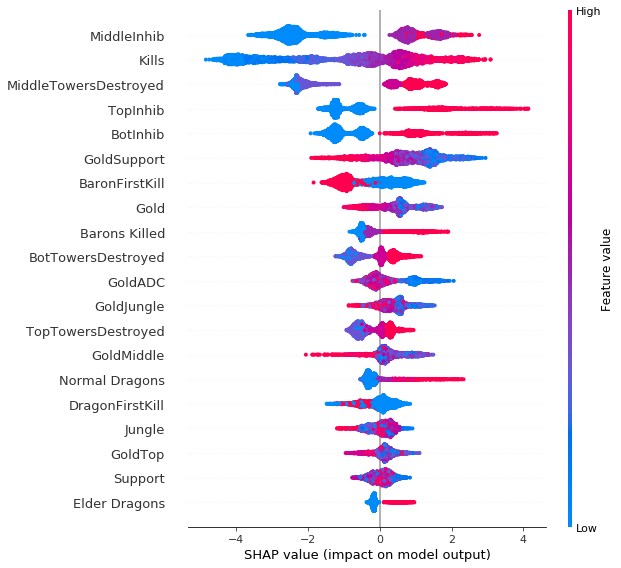

In [84]:
shap.summary_plot(shap_values, X_test)

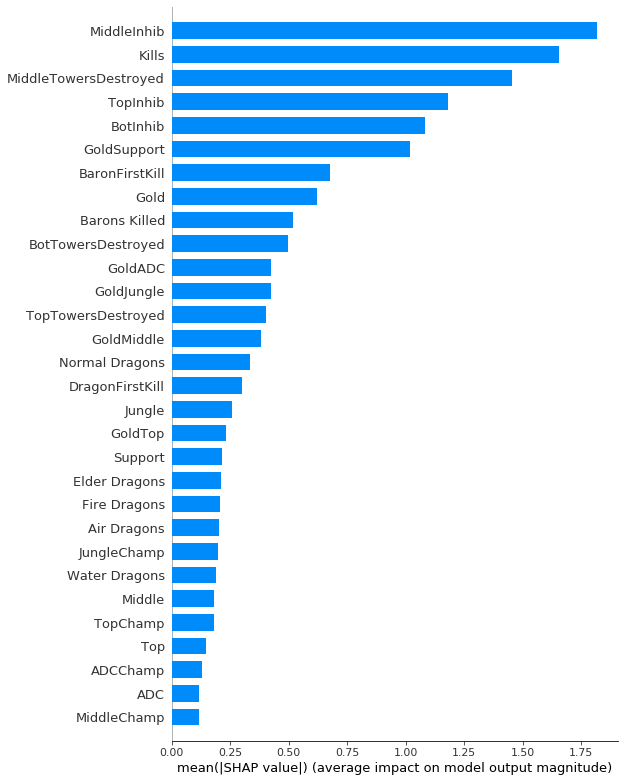

In [92]:
shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=30)

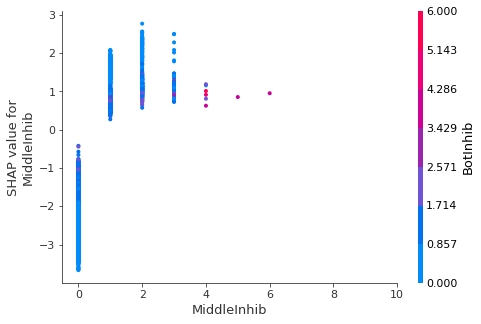

In [87]:
shap.dependence_plot("MiddleInhib", shap_values, X_test, xmax=10)

In [89]:
shap.force_plot(explainer.expected_value, shap_values[10,:], X_test.iloc[10,:])

In [68]:
list(y_test)

[0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
